In [1]:
import json
import os
import math


import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from glob import glob
import warnings
import pickle
from collections import defaultdict
from itertools import groupby
from scipy import stats

import seaborn as sns
from tqdm import tqdm
#better and bigger plots inline
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 250 # 200 e.g. is really fine, but slower


HOME="/linkhome/rech/genini01/ucv88ce/"
#10 ms per cluster unit

In [2]:
def get_phone_ali(ali_ctm, lang):
    phone_ali = pd.read_csv(ali_ctm, sep=" ", header=None)
    phone_ali.columns=["wav", "num", "onset", "dur_s", "phone_long", "None"]
    phone_ali["phone"] = phone_ali["phone_long"].apply(lambda x: x.split("_")[0])
    phone_ali["dur_ms"] = phone_ali["dur_s"].apply(lambda x: x*1000)
    phone_ali['wav'] = phone_ali['wav'].apply(lambda x: x.split('-')[1])


    if lang=="fr":
        phone_ali['phone'] = phone_ali['phone'].replace("au", "oo")
    return phone_ali

def sum_pool(row, w2feats):
    onset = math.ceil(row["onset"]*100)
    offset = math.ceil(row["onset"]*100+(row["dur_ms"]/10))
    cpc_feats_mat = w2feats[row["wav"]][onset:offset]
    return np.sum(cpc_feats_mat, axis=0)

def max_pool(row, w2feats):
    onset = math.ceil(row["onset"]*100)
    offset = math.ceil(row["onset"]*100+(row["dur_ms"]/10))
    cpc_feats_mat = w2feats[row["wav"]][onset:offset]
    return np.max(cpc_feats_mat, axis=0)

def avg_pool(row, w2feats):
    onset = math.ceil(row["onset"]*100)
    offset = math.ceil(row["onset"]*100+(row["dur_ms"]/10))
    cpc_feats_mat = w2feats[row["wav"]][onset:offset]
    return np.mean(cpc_feats_mat, axis=0)

def get_full_ali(w2feats, phone_ali, lang):
    phone_ali = phone_ali[phone_ali['phone']!="SIL"]
    phone_ali = phone_ali[phone_ali['wav'].isin(w2feats.keys())] 
    phone_ali['lang'] = lang
    phone_ali['max_pool'] = phone_ali.apply(max_pool, args=(w2feats,), axis = 1)
    phone_ali['sum_pool'] = phone_ali.apply(sum_pool, args=(w2feats,), axis = 1)
    phone_ali['avg_pool'] = phone_ali.apply(avg_pool, args=(w2feats,), axis = 1)
    return phone_ali

In [3]:
def get_w2feat(lang, root_path = '/gpfsssd/scratch/rech/ank/ucv88ce/projects/MultilingualCPC/checkpoints/inftrain/EN+FR/3200h/00/features/cpc_small/'):
    
    
    if not os.path.isfile(os.path.join(root_path, 'CV_{}'.format(lang),'w2feat.pkl')):
        w2feat = {} 
        cv_txt = [x for x in os.listdir(os.path.join(root_path, 'CV_{}'.format(lang)))]

        for wav in tqdm(cv_txt):
            with open(os.path.join(root_path, 'CV_{}'.format(lang), wav)) as infile:
                #w2feat[wav.split('.')[0]] = np.array([np.array(x.strip("\n{}'").split(' ')).astype(np.float) for x in infile]).astype(np.float)
                try:
                    w2feat[wav.split('.')[0]] = np.loadtxt(infile)
                except:
                    print(wav)
        print("Saving to pickle")
        with open(os.path.join(root_path, 'CV_{}'.format(lang),'w2feat.pkl'), 'wb') as handle:
            pickle.dump(w2feat, handle, protocol=pickle.HIGHEST_PROTOCOL)
    else:
        with open(os.path.join(root_path, 'CV_{}'.format(lang),'w2feat.pkl'), 'rb') as handle:
            w2feat = pickle.load(handle)
    return w2feat



def retrieve_alignment(ali_ctm, lang, root_path = '/gpfsssd/scratch/rech/ank/ucv88ce/projects/MultilingualCPC/checkpoints/inftrain/EN+FR/3200h/00/features/cpc_small/'):
    
    if os.path.isfile(os.path.join(root_path, 'CV_{}'.format(lang),'full_alignment.pkl')):
        with open(os.path.join(root_path, 'CV_{}'.format(lang),'full_alignment.pkl'), 'rb') as handle:
            phone_ali = pickle.load(handle)
            
    else:

        print('1. Retrieveing w2feats')
        w2feat = get_w2feat(lang, root_path = root_path)

        print('2. Loading Alignment')
        phone_ali = get_phone_ali(ali_ctm, lang)

        print('3. Aligning CPC representations to phones')
        phone_ali = get_full_ali(w2feat, phone_ali, lang)
        with open(os.path.join(root_path, 'CV_{}'.format(lang),'full_alignment.pkl'), 'wb') as handle:
            pickle.dump(phone_ali, handle, protocol=pickle.HIGHEST_PROTOCOL)
    
    return phone_ali
            
        

In [4]:
fr_phone_char = {'gn': 'nasal',
  'nn': 'nasal',
  'mm': 'nasal',
  'jj': 'fricative',
  'ss': 'fricative',
  'll': 'approximant',
  'bb': 'plosive',
  'kk': 'plosive',
  'vv': 'fricative',
  'zz': 'fricative',
  'gg': 'plosive',
  'ww': 'semi-vowel',
  'pp': 'plosive',
  'ff': 'fricative',
  'ch': 'fricative',
  'rr': 'fricative',
  'yy': 'approximant',
  'dd': 'plosive',
  'tt': 'plosive',
  'ou': 'vowel',
  'ei': 'vowel',
  'ii': 'vowel',
  'au': 'vowel',
  'aa': 'vowel',
  'ai': 'vowel',
  'on': 'nasal-vowel',
  'an': 'nasal-vowel',
  'oo': 'vowel',
  'oe': 'vowel',
  'eu': 'vowel',
  'ee': 'vowel',
  'un': 'nasal-vowel',
  'uu': 'vowel',
  'in': 'nasal-vowel',
  'uy': 'vowel'}

en_phone_char = {
    'dh': 'fricative', 'ah':'vowel', 'v':'fricative', 'ae':'vowel', 'l':'approximant', 'iy':'vowel',
    'w':'approximant', 'z':'fricative', 'f':'fricative', 'ih':'vowel', 'd':'plosive', 'th':'fricative',
    'eh':'vowel', 'n':'nasal', 's':'fricative', 'ao':'vowel', 'g':'plosive', 'jh':'affricate', 'k':'plosive',
    'm':'nasal', 'ay':'vowel', 'er':'vowel', 'ow':'vowel', 'r':'approximant', 'y':'approximant', 'uw':'vowel', 
    'hh':'fricative', 't':'plosive', 'p':'plosive', 'sh':'fricative', 'uh':'vowel', 'aa':'vowel', 'ng':'nasal', 
    'ey':'vowel', 'b':'plosive', 'aw':'vowel', 'ch':'affricate', 'oy':'vowel', 'zh':'fricative'
}

In [36]:
hours=100
model_lang="FR"
root = '/gpfsssd/scratch/rech/ank/ucv88ce/projects/MultilingualCPC/eval/inftrain/{}/{}h/00/features/cpc_small/'.format(model_lang, hours)
lang='en'
ali_ctm = "/gpfsscratch/rech/cfs/commun/cv21_ABX/raw_dataset/{}/{}_ali.ctm".format(lang, lang)
phone_ali_en = retrieve_alignment(ali_ctm, lang,  root_path=root)
phone_ali_en['char'] = phone_ali_en['phone'].apply(lambda x: en_phone_char[x])

print('----')

hours=100
root = '/gpfsssd/scratch/rech/ank/ucv88ce/projects/MultilingualCPC/eval/inftrain/{}/{}h/00/features/cpc_small/'.format(model_lang,hours)
lang='fr'
ali_ctm = "/gpfsscratch/rech/cfs/commun/cv21_ABX/raw_dataset/{}/{}_ali.ctm".format(lang, lang)
phone_ali_fr = retrieve_alignment(ali_ctm, lang,  root_path=root)
phone_ali_fr['char'] = phone_ali_fr['phone'].apply(lambda x: fr_phone_char[x])


  0%|          | 1/7043 [00:00<11:50,  9.90it/s]

1. Retrieveing w2feats


 40%|███▉      | 2817/7043 [05:43<07:21,  9.57it/s]

_info_args.json


100%|██████████| 7043/7043 [14:23<00:00,  8.16it/s]


Saving to pickle
2. Loading Alignment
3. Aligning CPC representations to phones


  0%|          | 0/7796 [00:00<?, ?it/s]

----
1. Retrieveing w2feats


 39%|███▉      | 3073/7796 [06:10<09:45,  8.07it/s]

_info_args.json


100%|██████████| 7796/7796 [14:51<00:00,  8.74it/s]


Saving to pickle
2. Loading Alignment
3. Aligning CPC representations to phones


In [37]:
phone_ali = phone_ali_fr.append(phone_ali_en)

In [38]:
N=2000 # #samples per lang
phone_ali_subset_fr = phone_ali_fr.sample(n=N, random_state=27)
phone_ali_subset_en = phone_ali_en.sample(n=N, random_state=27)
phone_ali_subset = phone_ali_subset_fr.append(phone_ali_subset_en)

In [39]:
max_pool_subset = phone_ali_subset.max_pool.tolist()
#max_pool_subset = pd.DataFrame(phone_ali_subset[['lang','max_pool']].max_pool.tolist(), index=phone_ali_subset[['lang','max_pool']].lang)

In [40]:
avg_pool_subset = phone_ali_subset.avg_pool.tolist()
#avg_pool_subset = pd.DataFrame(phone_ali_subset[['lang','avg_pool']].avg_pool.tolist(), index=phone_ali_subset[['lang','avg_pool']].lang)

In [41]:
sum_pool_subset = phone_ali_subset.sum_pool.tolist()
#sum_pool_subset = pd.DataFrame(phone_ali_subset[['lang','sum_pool']].sum_pool.tolist(), index=phone_ali_subset[['lang','sum_pool']].lang)


In [42]:
from sklearn.manifold import TSNE
import time

In [43]:
time_start = time.time()
#tsne = TSNE(verbose=1)
tsne = TSNE(n_components=2, verbose=1, n_iter=2500)
sum_tsne_results = tsne.fit_transform(sum_pool_subset)
avg_tsne_results = tsne.fit_transform(avg_pool_subset)
max_tsne_results = tsne.fit_transform(max_pool_subset)


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4000 samples in 0.001s...
[t-SNE] Computed neighbors for 4000 samples in 0.266s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4000
[t-SNE] Computed conditional probabilities for sample 2000 / 4000
[t-SNE] Computed conditional probabilities for sample 3000 / 4000
[t-SNE] Computed conditional probabilities for sample 4000 / 4000
[t-SNE] Mean sigma: 5.501387
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.955101
[t-SNE] KL divergence after 2500 iterations: 2.224067
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4000 samples in 0.001s...
[t-SNE] Computed neighbors for 4000 samples in 0.331s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4000
[t-SNE] Computed conditional probabilities for sample 2000 / 4000
[t-SNE] Computed conditional probabilities for sample 3000 / 4000
[t-SNE] Computed conditional probabilities for sample 4000 / 4000
[t-SNE] Mean sigma: 0.964000


Text(0.5, 1.0, 'CV phoneme representations (4000 subset) using SUM pooling on the 100h FR model')

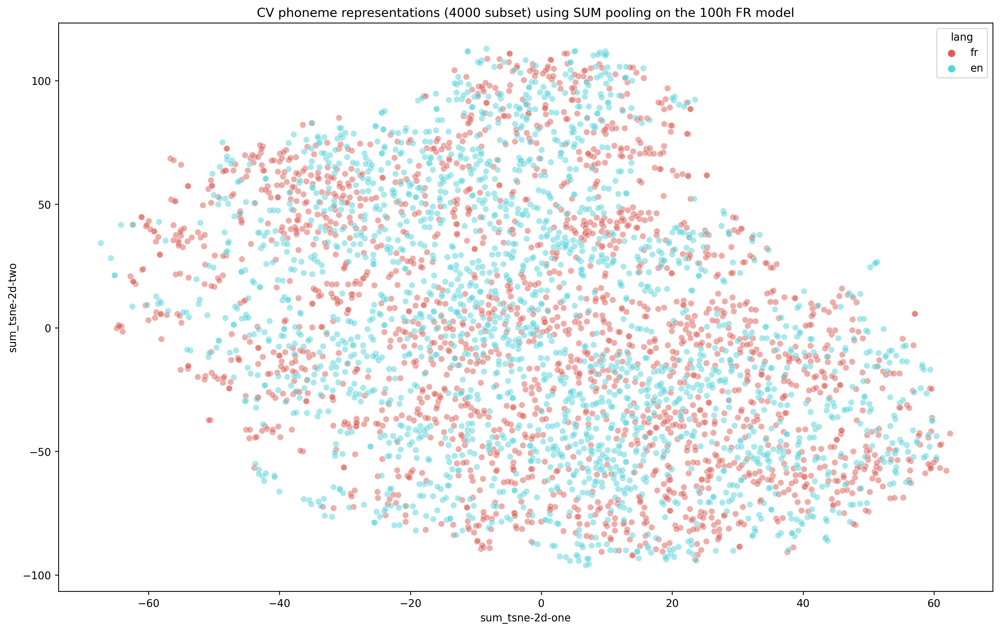

In [44]:
phone_ali_subset['sum_tsne-2d-one'] = sum_tsne_results[:,0]
phone_ali_subset['sum_tsne-2d-two'] = sum_tsne_results[:,1]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="sum_tsne-2d-one", y="sum_tsne-2d-two",
    hue="lang",
    palette=sns.color_palette("hls", 2),
    data=phone_ali_subset,
    legend="full",
    alpha=0.5
)
plt.title('CV phoneme representations (4000 subset) using SUM pooling on the {}h {} model'.format(hours,model_lang.upper()))

Text(0.5, 1.0, 'CV phoneme representations (4000 subset) using SUM pooling on the 100h FR model')

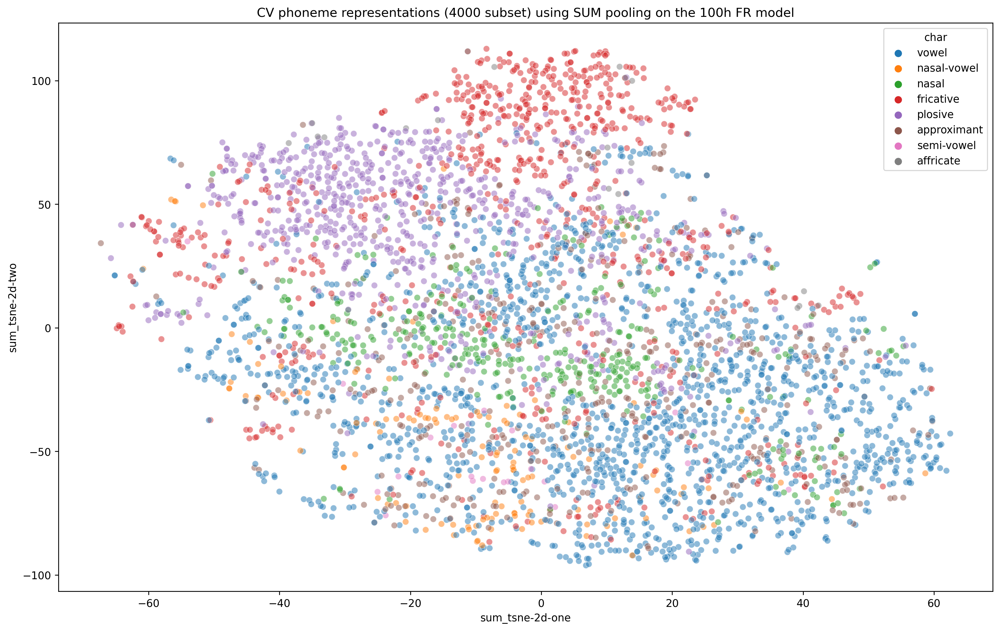

In [45]:
phone_ali_subset['sum_tsne-2d-one'] = sum_tsne_results[:,0]
phone_ali_subset['sum_tsne-2d-two'] = sum_tsne_results[:,1]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="sum_tsne-2d-one", y="sum_tsne-2d-two",
    hue="char",
    data=phone_ali_subset,
    legend="full",
    alpha=0.5
)
plt.title('CV phoneme representations (4000 subset) using SUM pooling on the {}h {} model'.format(hours, model_lang.upper()))

Text(0.5, 1.0, 'CV phoneme representations (4000 subset) using MAX pooling on the 100h FR model')

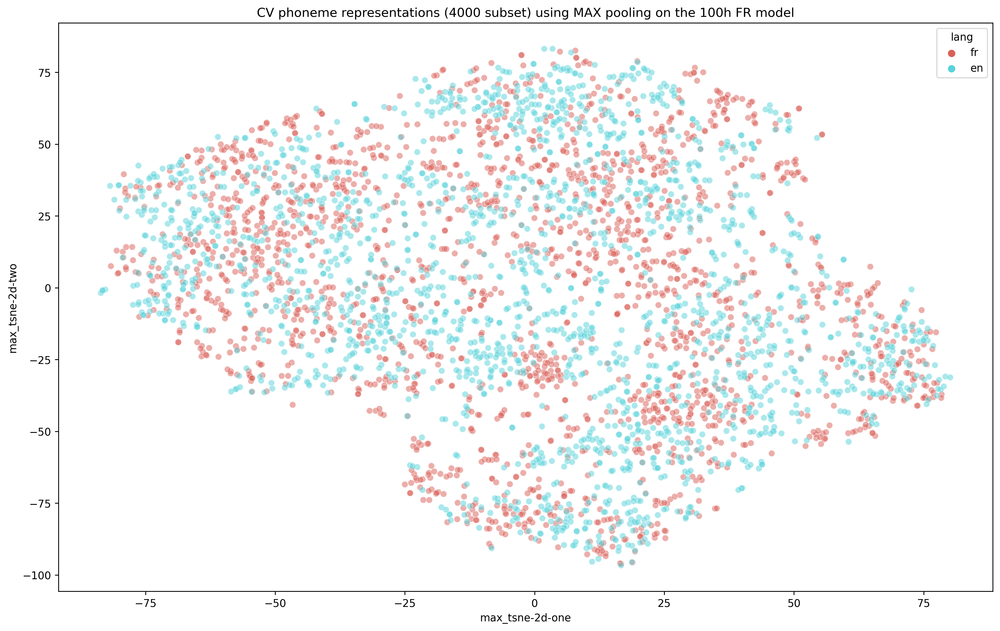

In [46]:
phone_ali_subset['max_tsne-2d-one'] = max_tsne_results[:,0]
phone_ali_subset['max_tsne-2d-two'] = max_tsne_results[:,1]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="max_tsne-2d-one", y="max_tsne-2d-two",
    hue="lang",
    palette=sns.color_palette("hls", 2),
    data=phone_ali_subset,
    legend="full",
    alpha=0.5
)
plt.title('CV phoneme representations (4000 subset) using MAX pooling on the {}h {} model'.format(hours, model_lang.upper()))

Text(0.5, 1.0, 'CV phoneme representations (4000 subset) using AVG pooling on the 100h FR model')

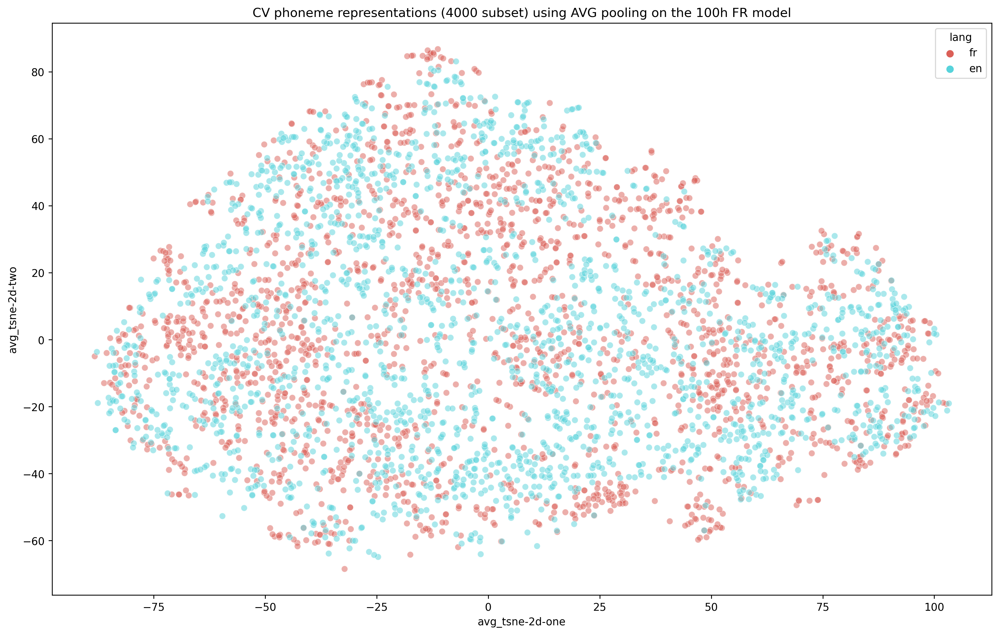

In [47]:
phone_ali_subset['avg_tsne-2d-one'] = avg_tsne_results[:,0]
phone_ali_subset['avg_tsne-2d-two'] = avg_tsne_results[:,1]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="avg_tsne-2d-one", y="avg_tsne-2d-two",
    hue="lang",
    palette=sns.color_palette("hls", 2),
    data=phone_ali_subset,
    legend="full",
    alpha=0.5
)
plt.title('CV phoneme representations (4000 subset) using AVG pooling on the {}h {} model'.format(hours, model_lang.upper()))

Text(0.5, 1.0, 'CV phoneme representations (4000 subset) using AVG pooling on the 100h FR model')

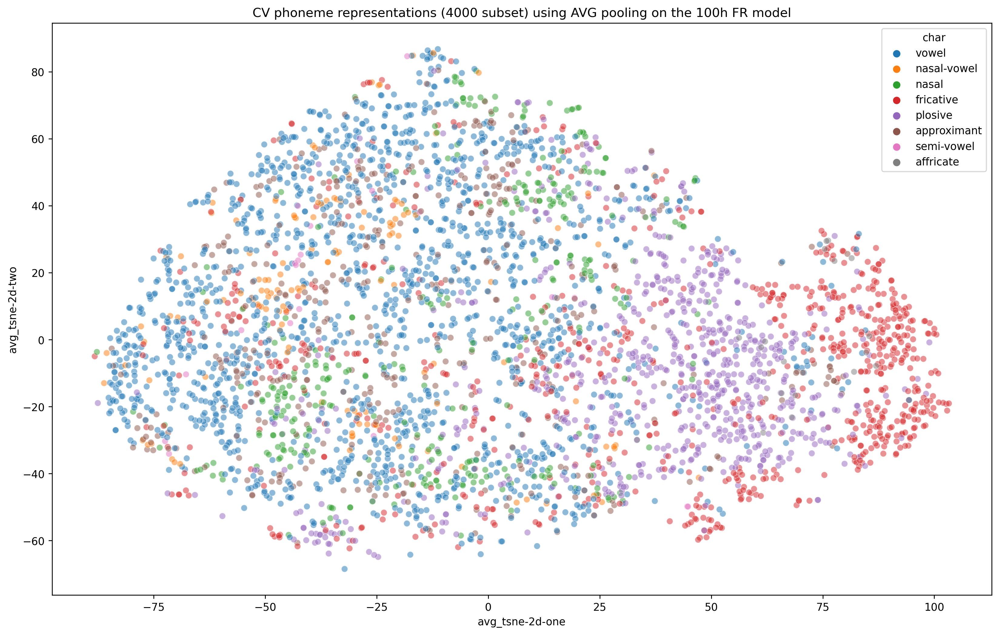

In [48]:
phone_ali_subset['avg_tsne-2d-one'] = avg_tsne_results[:,0]
phone_ali_subset['avg_tsne-2d-two'] = avg_tsne_results[:,1]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="avg_tsne-2d-one", y="avg_tsne-2d-two",
    hue="char",
    data=phone_ali_subset,
    legend="full",
    alpha=0.5
)
plt.title('CV phoneme representations (4000 subset) using AVG pooling on the {}h {} model'.format(hours, model_lang.upper()))